# Analyzing Colors from Images
References:
1. [Image Color Extraction with Python in 4 Steps](https://towardsdatascience.com/image-color-extraction-with-python-in-4-steps-8d9370d9216e)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg

from PIL import Image
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

In [2]:
#!pip install easydev                 #version 0.12.0
#!pip install colormap                #version 1.0.4
#!pip install opencv-python           #version 4.5.5.64
#!pip install colorgram.py            #version 1.2.0
#!pip install extcolors               #version 1.0.0

import cv2
import extcolors

from colormap import rgb2hex

In [3]:
import os

In [4]:
def color_to_df(input):
    colors_pre_list = str(input).replace('([(','').split(', (')[0:-1]
    df_rgb = [i.split('), ')[0] + ')' for i in colors_pre_list]
    df_percent = [i.split('), ')[1].replace(')','') for i in colors_pre_list]
    
    #convert RGB to HEX code
    df_color_up = [rgb2hex(int(i.split(", ")[0].replace("(","")),
                          int(i.split(", ")[1]),
                          int(i.split(", ")[2].replace(")",""))) for i in df_rgb]
    
    df = pd.DataFrame(zip(df_color_up, df_percent), columns = ['c_code','occurence'])
    return df

In [5]:
def exact_color(input_image, resize, tolerance, zoom):
    #background
    bg = 'bg.png'
    fig, ax = plt.subplots(figsize=(192,108),dpi=10)
    fig.set_facecolor('white')
    plt.savefig(bg)
    plt.close(fig)
    
    #resize
    output_width = resize
    img = Image.open(input_image)
    input_file=os.path.basename(input_image)
    file_path=os.path.dirname(input_image)
    if img.size[0] >= resize:
        wpercent = (output_width/float(img.size[0]))
        hsize = int((float(img.size[1])*float(wpercent)))
        img = img.resize((output_width,hsize), Image.ANTIALIAS)
        resize_name = file_path+'/resize_'+ input_file
        img.save(resize_name)
    else:
        resize_name = input_image
    
    #crate dataframe
    img_url = resize_name
    colors_x = extcolors.extract_from_path(img_url, tolerance = tolerance, limit = 13)
    df_color = color_to_df(colors_x)
    
    #annotate text
    list_color = list(df_color['c_code'])
    list_precent = [int(i) for i in list(df_color['occurence'])]
    text_c = [c + ' ' + str(round(p*100/sum(list_precent),1)) +'%' for c, p in zip(list_color, list_precent)]
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(160,120), dpi = 10)
    
    #donut plot
    wedges, text = ax1.pie(list_precent,
                           labels= text_c,
                           labeldistance= 1.05,
                           colors = list_color,
                           textprops={'fontsize': 150, 'color':'black'})
    plt.setp(wedges, width=0.3)

    #add image in the center of donut plot
    img = mpimg.imread(resize_name)
    imagebox = OffsetImage(img, zoom=zoom)
    ab = AnnotationBbox(imagebox, (0, 0))
    ax1.add_artist(ab)
    
    #color palette
    x_posi, y_posi, y_posi2 = 160, -170, -170
    for c in list_color:
        if list_color.index(c) <= 5:
            y_posi += 180
            rect = patches.Rectangle((x_posi, y_posi), 360, 160, facecolor = c)
            ax2.add_patch(rect)
            ax2.text(x = x_posi+400, y = y_posi+100, s = c, fontdict={'fontsize': 190})
        else:
            y_posi2 += 180
            rect = patches.Rectangle((x_posi + 1000, y_posi2), 360, 160, facecolor = c)
            ax2.add_artist(rect)
            ax2.text(x = x_posi+1400, y = y_posi2+100, s = c, fontdict={'fontsize': 190})

    fig.set_facecolor('white')
    ax2.axis('off')
    bg = plt.imread('bg.png')
    plt.imshow(bg)       
    plt.tight_layout()
    return plt.show()

In [6]:
from os import listdir
path='../images/'
file_names = listdir(path)

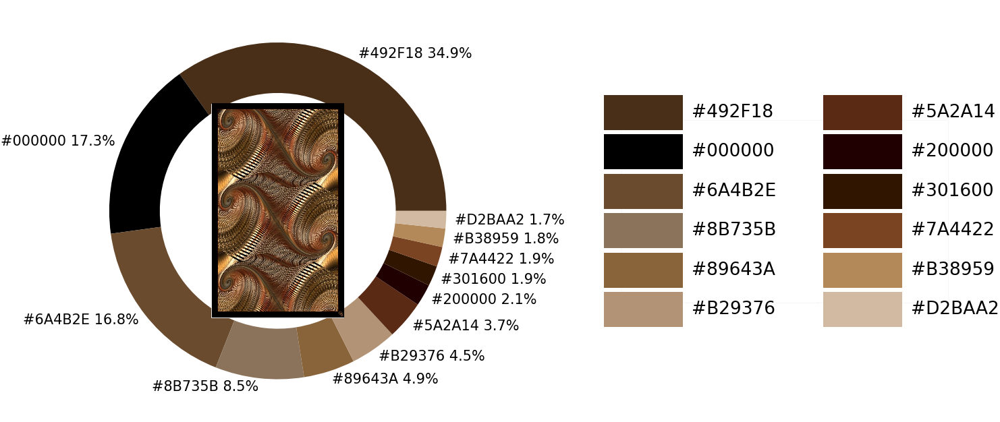

In [7]:
#for file in file_names:
#    exact_color(path+file, 900, 12, 2.5)
exact_color(path+file_names[0], 900, 12, 2.5)

/tmp/ipykernel_308874/2347143625.py:17: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((output_width,hsize), Image.ANTIALIAS)


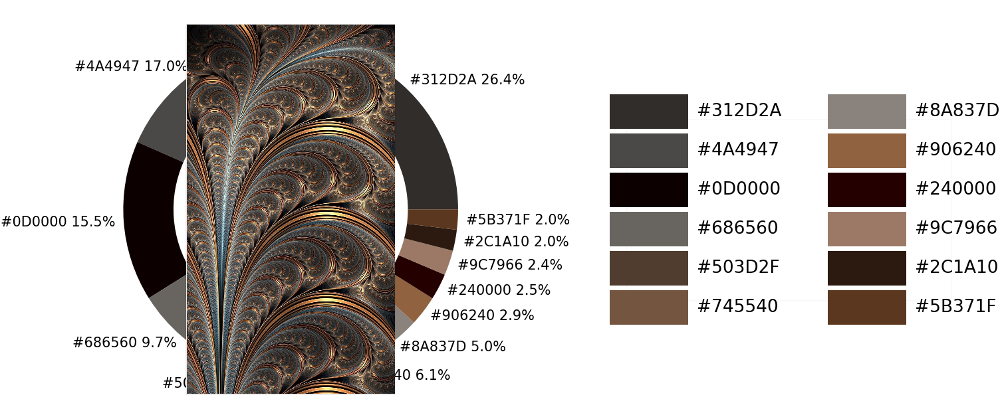

In [8]:
exact_color(path+file_names[1], 900, 12, 2.5)

/tmp/ipykernel_308874/2347143625.py:17: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((output_width,hsize), Image.ANTIALIAS)


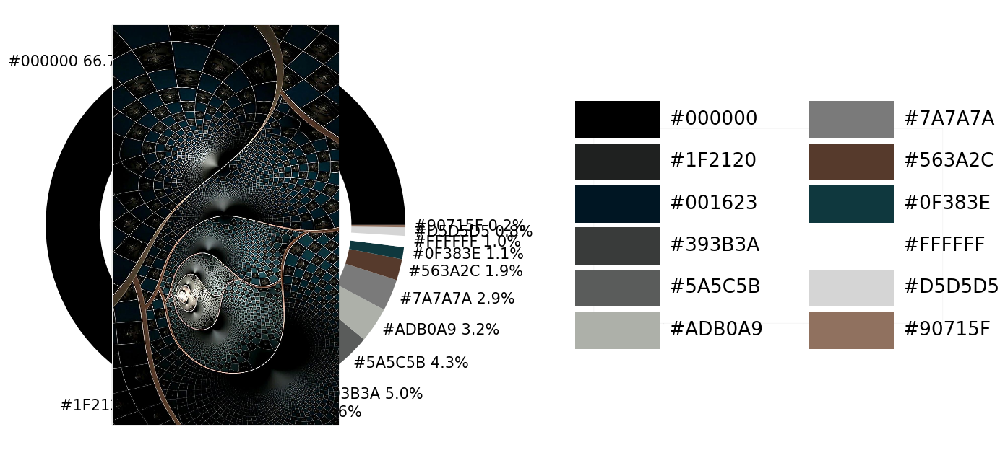

In [9]:
exact_color(path+file_names[2], 900, 12, 2.5)

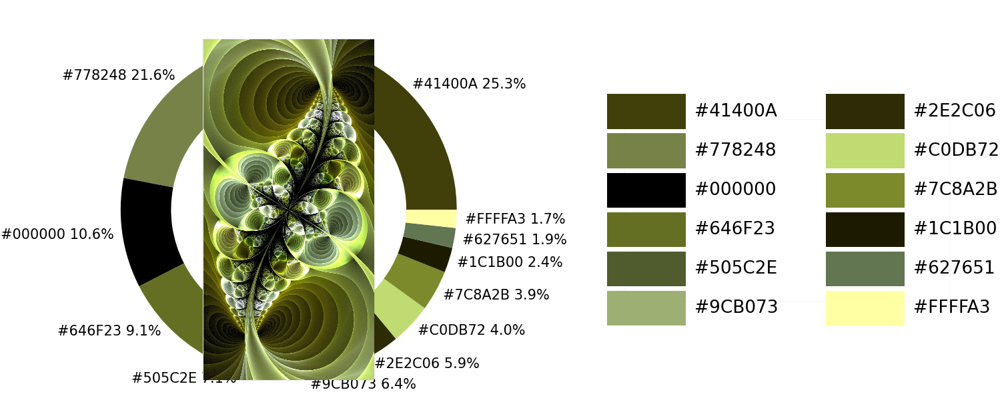

In [10]:
exact_color(path+file_names[3], 900, 12, 2.5)

/tmp/ipykernel_308874/2347143625.py:17: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((output_width,hsize), Image.ANTIALIAS)


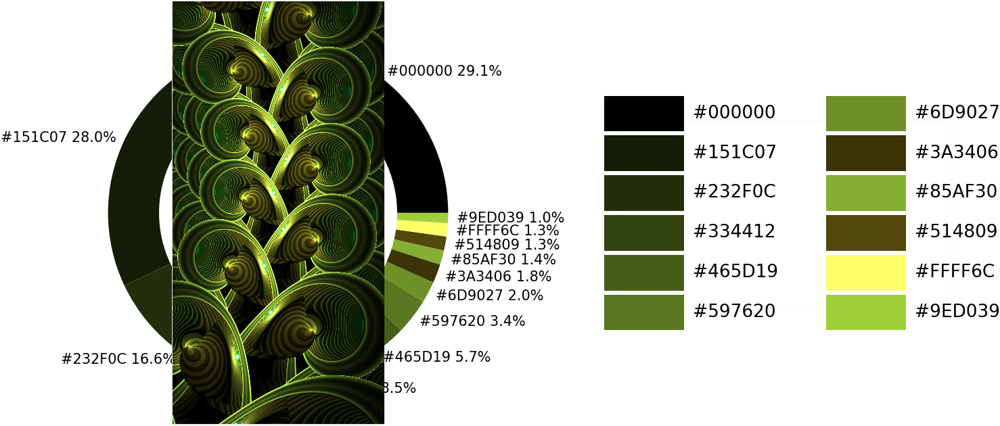

In [11]:
exact_color(path+file_names[4], 900, 12, 2.5)

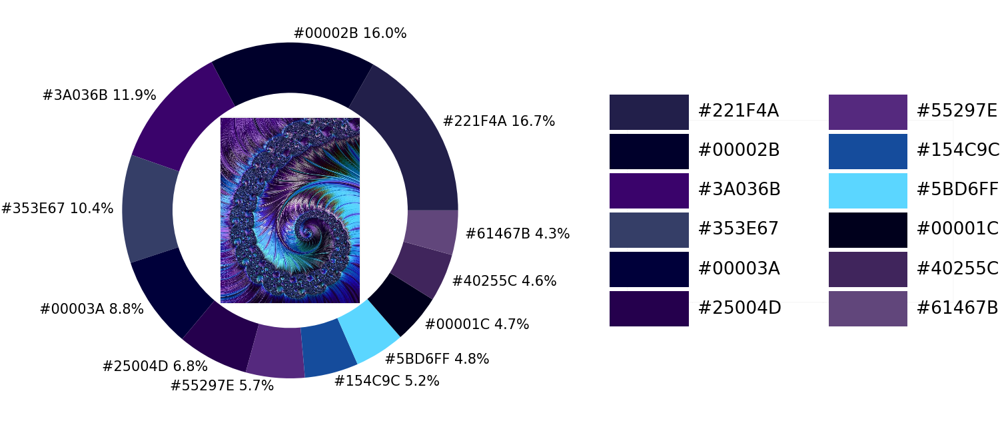

In [12]:
exact_color(path+file_names[5], 900, 12, 2.5)

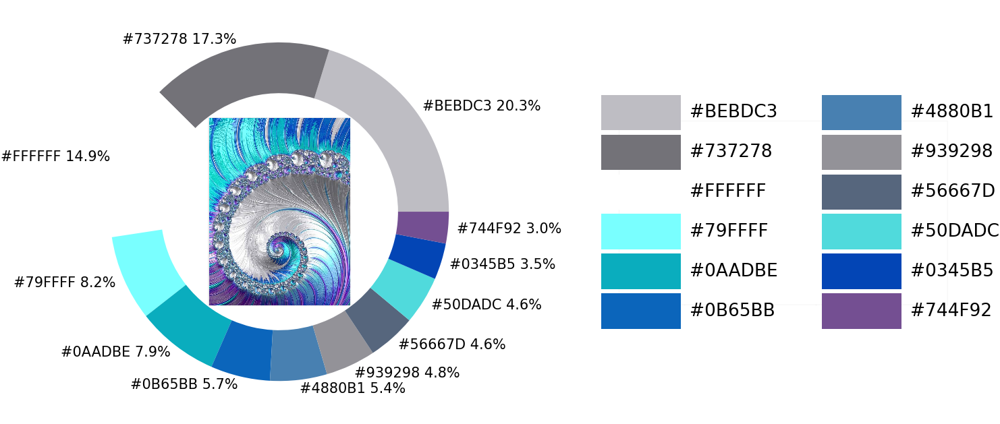

In [13]:
exact_color(path+file_names[6], 900, 12, 2.5)

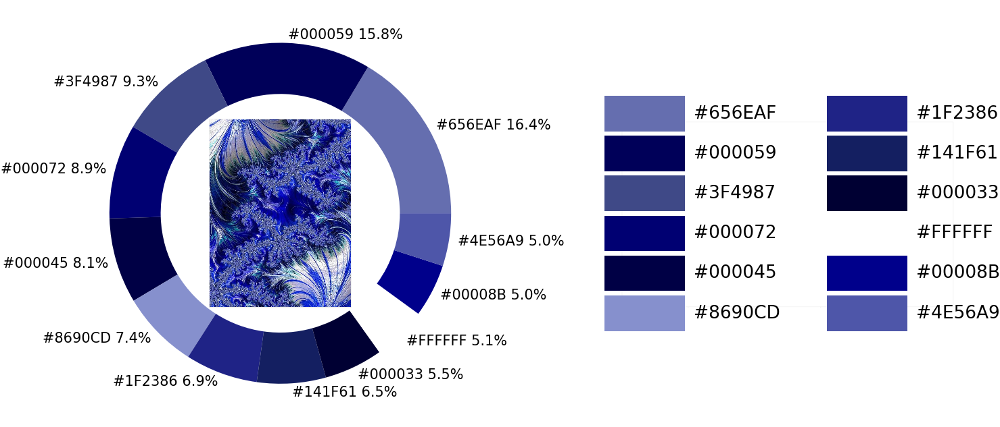

In [14]:
exact_color(path+file_names[7], 900, 12, 2.5)

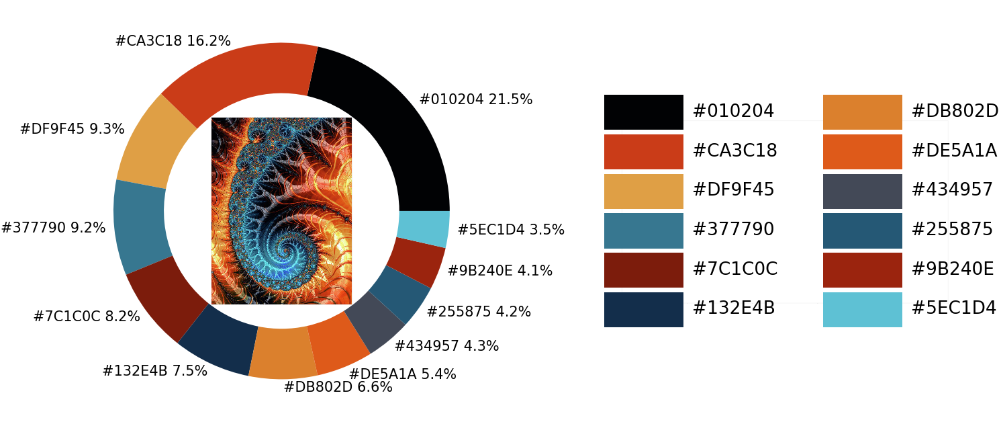

In [15]:
exact_color(path+file_names[8], 900, 12, 2.5)

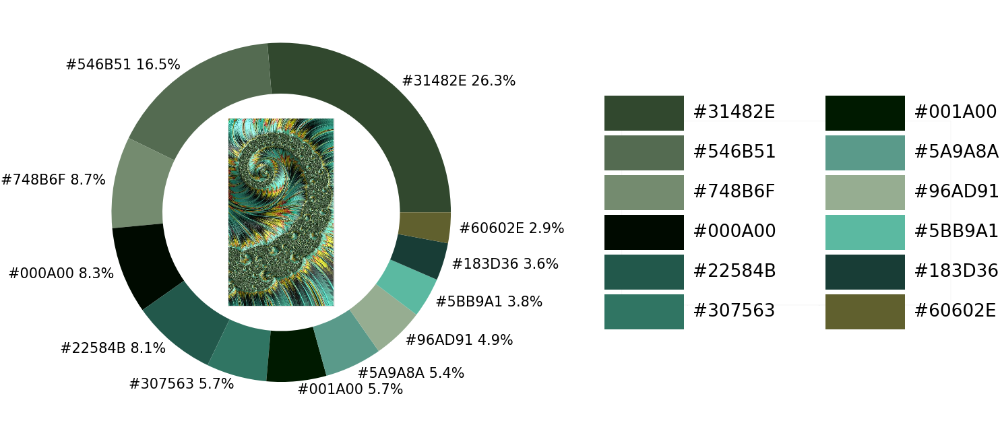

In [16]:
exact_color(path+file_names[9], 900, 12, 2.5)

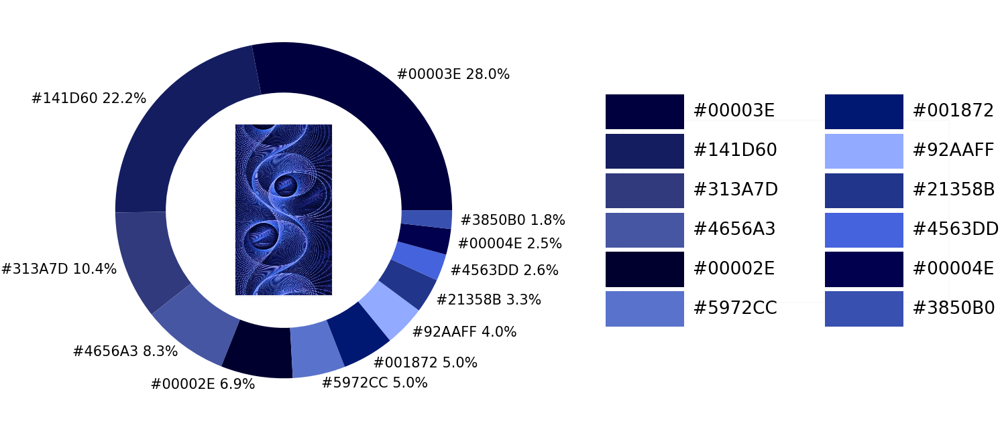

In [17]:
exact_color(path+file_names[10], 900, 12, 2.5)

/tmp/ipykernel_308874/2347143625.py:17: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((output_width,hsize), Image.ANTIALIAS)


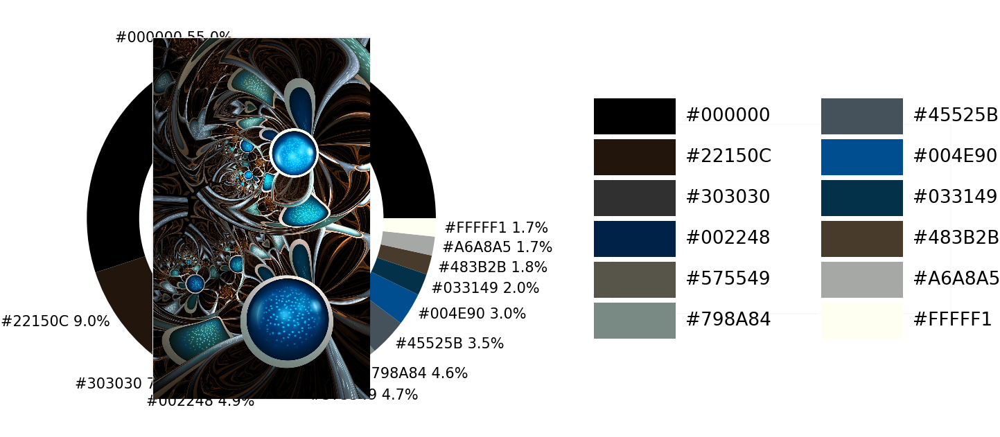

In [18]:
exact_color(path+file_names[11], 900, 12, 2.5)

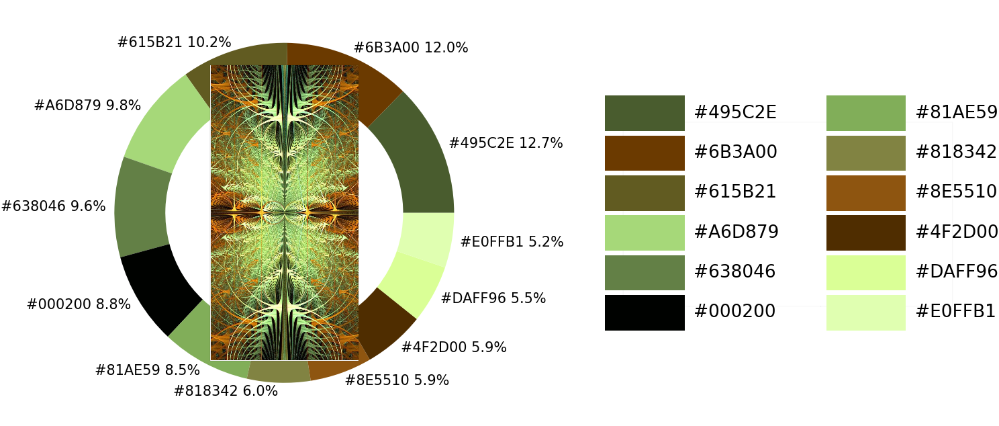

In [19]:
exact_color(path+file_names[12], 900, 12, 2.5)

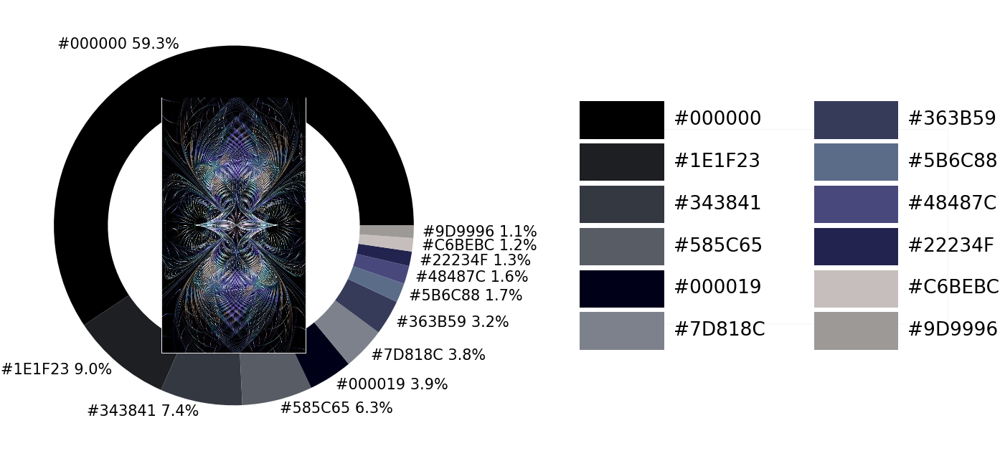

In [20]:
exact_color(path+file_names[13], 900, 12, 2.5)

/tmp/ipykernel_308874/2347143625.py:17: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((output_width,hsize), Image.ANTIALIAS)


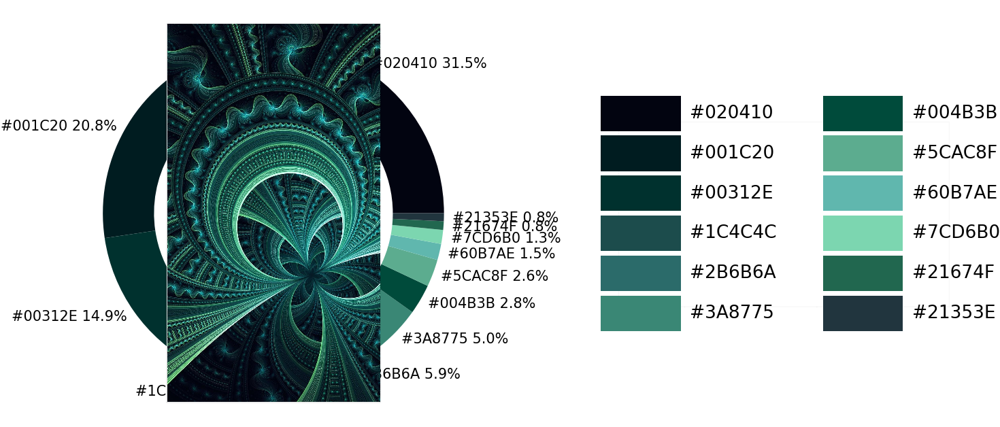

In [21]:
exact_color(path+file_names[14], 900, 12, 2.5)

/tmp/ipykernel_308874/2347143625.py:17: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((output_width,hsize), Image.ANTIALIAS)


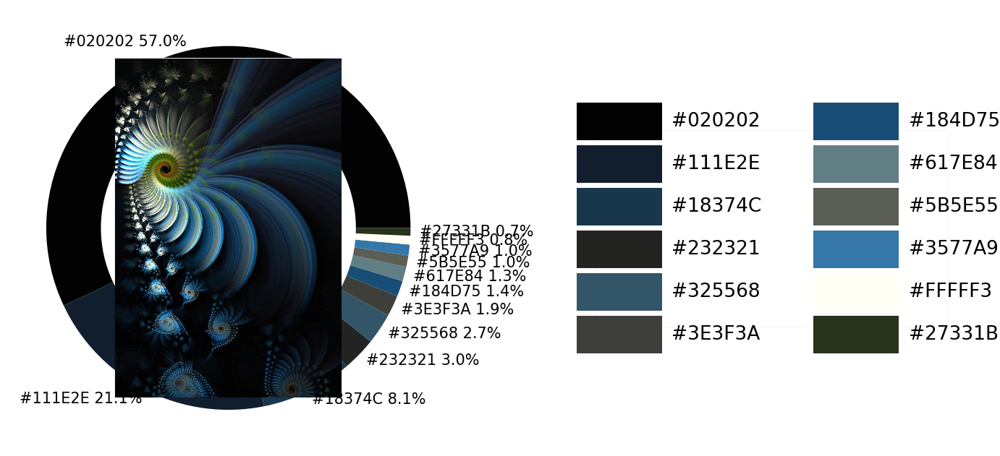

In [22]:
exact_color(path+file_names[15], 900, 12, 2.5)

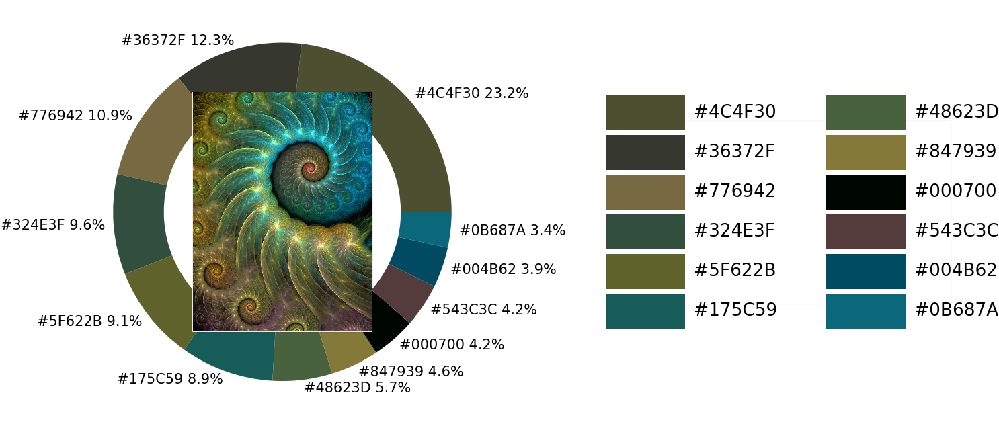

In [23]:
exact_color(path+file_names[16], 900, 12, 2.5)

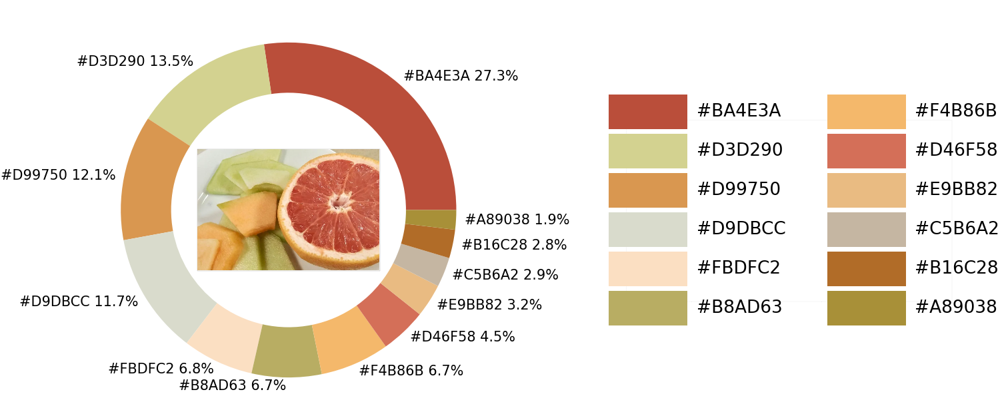

In [24]:
exact_color(path+file_names[17], 900, 12, 2.5)

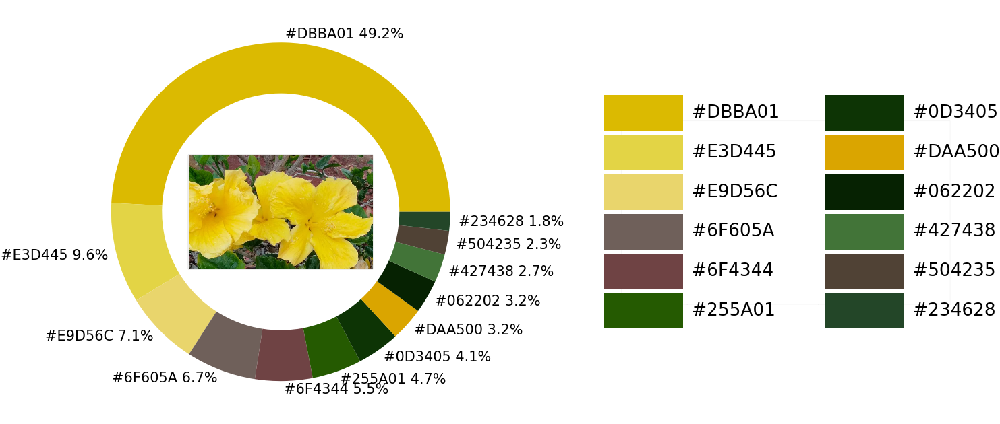

In [25]:
exact_color(path+file_names[18], 900, 12, 2.5)

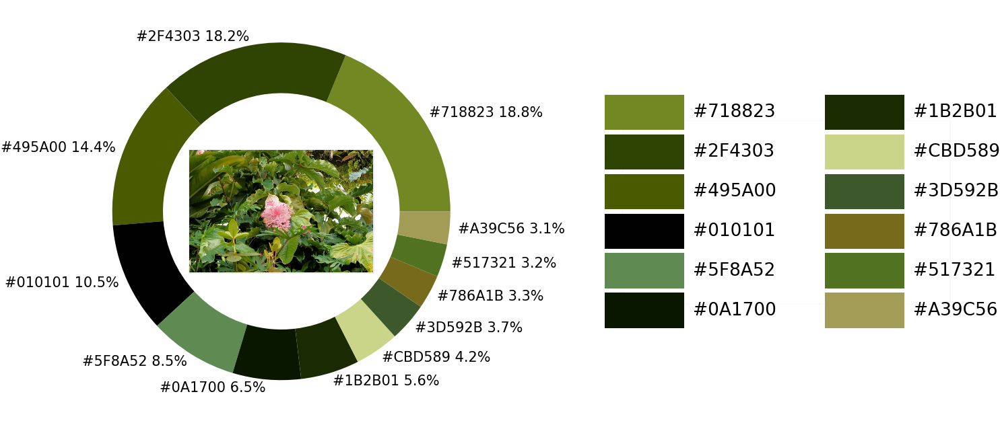

In [26]:
exact_color(path+file_names[19], 900, 12, 2.5)

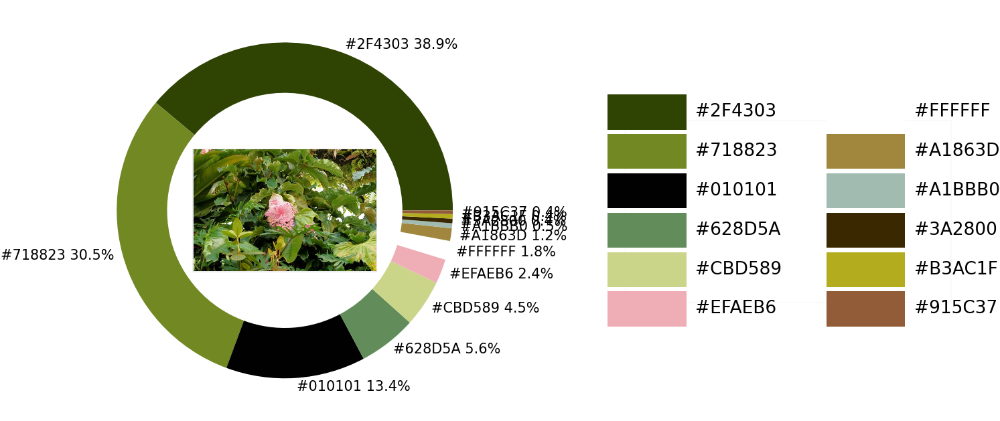

In [27]:
exact_color(path+file_names[19], 900, 24, 2.5)

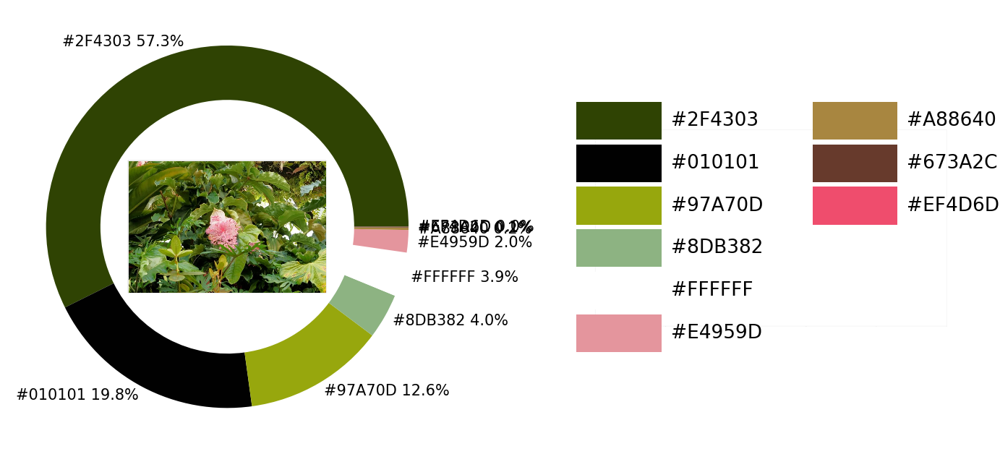

In [28]:
exact_color(path+file_names[19], 900, 36, 2.5)